In [ ]:
!pip install PyMuPDF
import nltk
nltk.download('punkt')

from google.colab import drive
import pandas as pd
import numpy as np
import fitz
from nltk.tokenize import sent_tokenize

import codecs
import os
import spacy
import json
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from pathlib import Path

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
!pip install afinn
from afinn import Afinn
from nltk.tokenize import sent_tokenize
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# Open the PDF files
pdf_path_1 = '/content/Stephenie_Meyer_1._Twilight.pdf'
pdf_path_2 = '/content/Stephenie_Meyer_2._New_Moon.pdf'
pdf_path_3 = '/content/Stephenie_Meyer_3._Eclipse.pdf'
pdf_path_4 = '/content/Stephenie_Meyer_4._Breaking_Dawn.pdf'

# Function to extract text from a PDF file
def read_pdf(pdf_path):
    doc = fitz.open(pdf_path)
    text = ''
    for page_num in range(doc.page_count):
        page = doc[page_num]
        text += page.get_text()
    return text

# Read the PDF files
text_1 = read_pdf(pdf_path_1)
text_2 = read_pdf(pdf_path_2)
text_3 = read_pdf(pdf_path_3)
text_4 = read_pdf(pdf_path_4)

# Create DataFrames if needed
sentence_list_1 = sent_tokenize(text_1)
sentence_list_2 = sent_tokenize(text_2)
sentence_list_3 = sent_tokenize(text_3)
sentence_list_4 = sent_tokenize(text_4)

In [ ]:
def calculate_align_rate(sentence_list):
    '''
    Function to calculate the align_rate of the whole novel
    :param sentence_list: the list of sentence of the whole novel.
    :return: the align rate of the novel.
    '''
    afinn = Afinn()
    sentiment_score = [afinn.score(x) for x in sentence_list]
    align_rate = np.sum(sentiment_score)/len(np.nonzero(sentiment_score)[0]) * -2

    return align_rate

align_rate_1 = calculate_align_rate(sentence_list_1)
align_rate_2 = calculate_align_rate(sentence_list_2)
align_rate_3 = calculate_align_rate(sentence_list_3)
align_rate_4 = calculate_align_rate(sentence_list_4)

In [ ]:
def common_words(path):
    '''
    A function to read-in the top common words from external .txt document.
    :param path: The path where the common words info is stored.
    :return: A set of the top common words.
    '''

    with codecs.open(path) as f:
        words = f.read()
        words = json.loads(words)

    return set(words)

In [ ]:
nlp = spacy.load('en_core_web_sm')
words = common_words('/content/common_words.txt')

In [ ]:
def flatten(input_list):
    '''
    A function to flatten complex list.
    :param input_list: The list to be flatten
    :return: the flattened list.
    '''

    flat_list = []
    for i in input_list:
        if type(i) == list:
            flat_list += flatten(i)
        else:
            flat_list += [i]

    return flat_list

In [ ]:
def name_entity_recognition(sentence):
    '''
    A function to retrieve name entities in a sentence.
    :param sentence: the sentence to retrieve names from.
    :return: a name entity list of the sentence.
    '''

    doc = nlp(sentence)
    # retrieve person and organization's name from the sentence
    name_entity = [x for x in doc.ents if x.label_ in ['PERSON', 'ORG']]
    # convert all names to lowercase and remove 's in names
    name_entity = [str(x).lower().replace("'s","") for x in name_entity]
    # split names into single words ('Harry Potter' -> ['Harry', 'Potter'])
    name_entity = [x.split(' ') for x in name_entity]
    # flatten the name list
    name_entity = flatten(name_entity)
    # remove name words that are less than 3 letters to raise recognition accuracy
    name_entity = [x for x in name_entity if len(x) >= 3]
    # remove name words that are in the set of 4000 common words
    name_entity = [x for x in name_entity if x not in words]

    return name_entity

In [ ]:
def iterative_NER(sentence_list, threshold_rate=0.0005):
    '''
    A function to execute the name entity recognition function iteratively. The purpose of this
    function is to recognise all the important names while reducing recognition errors.
    :param sentence_list: the list of sentences from the novel
    :param threshold_rate: the per sentence frequency threshold, if a word's frequency is lower than this
    threshold, it would be removed from the list because there might be recognition errors.
    :return: a non-duplicate list of names in the novel.
    '''

    output = []
    for i in sentence_list:
        name_list = name_entity_recognition(i)
        if name_list != []:
            output.append(name_list)
    output = flatten(output)
    from collections import Counter
    output = Counter(output)
    output = [x for x in output if output[x] >= threshold_rate * len(sentence_list)]

    return output

preliminary_name_list_1 = iterative_NER(sentence_list_1)
preliminary_name_list_2 = iterative_NER(sentence_list_2)
preliminary_name_list_3 = iterative_NER(sentence_list_3)
preliminary_name_list_4 = iterative_NER(sentence_list_4)

In [ ]:
for i in ['cope','aro','sam','renée','embry','victoria']:
    for j in [preliminary_name_list_1, preliminary_name_list_2,preliminary_name_list_3,preliminary_name_list_4]:
        if i not in j:
            j.append(i)

for i in ['cullens','cullen','banner','forks','volvo','swan','jeep','abc','aki','volturi']:
    for j in [preliminary_name_list_1, preliminary_name_list_2,preliminary_name_list_3,preliminary_name_list_4]:
        if i in j:
            j.remove(i)

for j in [preliminary_name_list_1, preliminary_name_list_2,preliminary_name_list_3,preliminary_name_list_4]:
    j = list(set(j))

In [ ]:
preliminary_name_list_1

['carlisle',
 'bella',
 'charlie',
 'phil',
 'renée',
 'billy',
 'isabella',
 'eric',
 'trig',
 'edward',
 'emmett',
 'rosalie',
 'jasper',
 'alice',
 'jessica',
 'angela',
 'mike',
 'tyler',
 'jess',
 'lauren',
 'esme',
 'jacob',
 'james',
 'laurent',
 'cope',
 'aro',
 'sam',
 'embry',
 'victoria']

In [ ]:
def top_names(name_list, novel, top_num=20):
    '''
    A function to return the top names in a novel and their frequencies.
    :param name_list: the non-duplicate list of names of a novel.
    :param novel: the novel text.
    :param top_num: the number of names the function finally output.
    :return: the list of top names and the list of top names' frequency.
    '''

    vect = CountVectorizer(vocabulary=name_list, stop_words='english')
    name_frequency = vect.fit_transform([novel.lower()])
    name_frequency = pd.DataFrame(name_frequency.toarray(), columns=vect.get_feature_names_out())
    name_frequency = name_frequency.T
    name_frequency = name_frequency.sort_values(by=0, ascending=False)
    name_frequency = name_frequency[0:top_num]
    names = list(name_frequency.index)
    name_frequency = list(name_frequency[0])

    return name_frequency, names

name_frequency_1, name_list_1 = top_names(preliminary_name_list_1, text_1, 25)
name_frequency_2, name_list_2 = top_names(preliminary_name_list_2, text_2, 25)
name_frequency_3, name_list_3 = top_names(preliminary_name_list_3, text_3, 25)
name_frequency_4, name_list_4 = top_names(preliminary_name_list_4, text_4, 25)

In [ ]:
def calculate_matrix(name_list, sentence_list, align_rate):
    '''
    Function to calculate the co-occurrence matrix and sentiment matrix among all the top characters
    :param name_list: the list of names of the top characters in the novel.
    :param sentence_list: the list of sentences in the novel.
    :param align_rate: the sentiment alignment rate to align the sentiment score between characters due to the writing style of
    the author. Every co-occurrence will lead to an increase or decrease of one unit of align_rate.
    :return: the co-occurrence matrix and sentiment matrix.
    '''

    # calculate a sentiment score for each sentence in the novel
    afinn = Afinn()
    sentiment_score = [afinn.score(x) for x in sentence_list]
    # calculate occurrence matrix and sentiment matrix among the top characters
    name_vect = CountVectorizer(vocabulary=name_list, binary=True)
    occurrence_each_sentence = name_vect.fit_transform(sentence_list).toarray()
    cooccurrence_matrix = np.dot(occurrence_each_sentence.T, occurrence_each_sentence)
    sentiment_matrix = np.dot(occurrence_each_sentence.T, (occurrence_each_sentence.T * sentiment_score).T)
    sentiment_matrix += align_rate * cooccurrence_matrix
    cooccurrence_matrix = np.tril(cooccurrence_matrix)
    sentiment_matrix = np.tril(sentiment_matrix)
    # diagonals of the matrices are set to be 0 (co-occurrence of name itself is meaningless)
    shape = cooccurrence_matrix.shape[0]
    cooccurrence_matrix[[range(shape)], [range(shape)]] = 0
    sentiment_matrix[[range(shape)], [range(shape)]] = 0

    return cooccurrence_matrix, sentiment_matrix

cooccurrence_matrix_1, sentiment_matrix_1 = calculate_matrix(name_list_1, sentence_list_1, align_rate_1)
cooccurrence_matrix_2, sentiment_matrix_2 = calculate_matrix(name_list_2, sentence_list_2, align_rate_2)
cooccurrence_matrix_3, sentiment_matrix_3 = calculate_matrix(name_list_3, sentence_list_3, align_rate_3)
cooccurrence_matrix_4, sentiment_matrix_4 = calculate_matrix(name_list_4, sentence_list_4, align_rate_4)

In [ ]:
def matrix_to_edge_list(matrix, mode, name_list):
    '''
    Function to convert matrix (co-occurrence/sentiment) to edge list of the network graph. It determines the
    weight and color of the edges in the network graph.
    :param matrix: co-occurrence matrix or sentiment matrix.
    :param mode: 'co-occurrence' or 'sentiment'
    :param name_list: the list of names of the top characters in the novel.
    :return: the edge list with weight and color param.
    '''
    edge_list = []
    shape = matrix.shape[0]
    lower_tri_loc = list(zip(*np.where(np.triu(np.ones([shape, shape])) == 0)))
    normalized_matrix = matrix / np.max(np.abs(matrix))
    if mode == 'co-occurrence':
        weight = np.log(2000 * normalized_matrix + 1) * 0.7
        color = np.log(2000 * normalized_matrix + 1)
    if mode == 'sentiment':
        weight = np.log(np.abs(1000 * normalized_matrix) + 1) * 0.7
        color = 500 * normalized_matrix
    for i in lower_tri_loc:
        edge_list.append((name_list[i[0]], name_list[i[1]], {'weight': weight[i], 'color': color[i]}))

    return edge_list

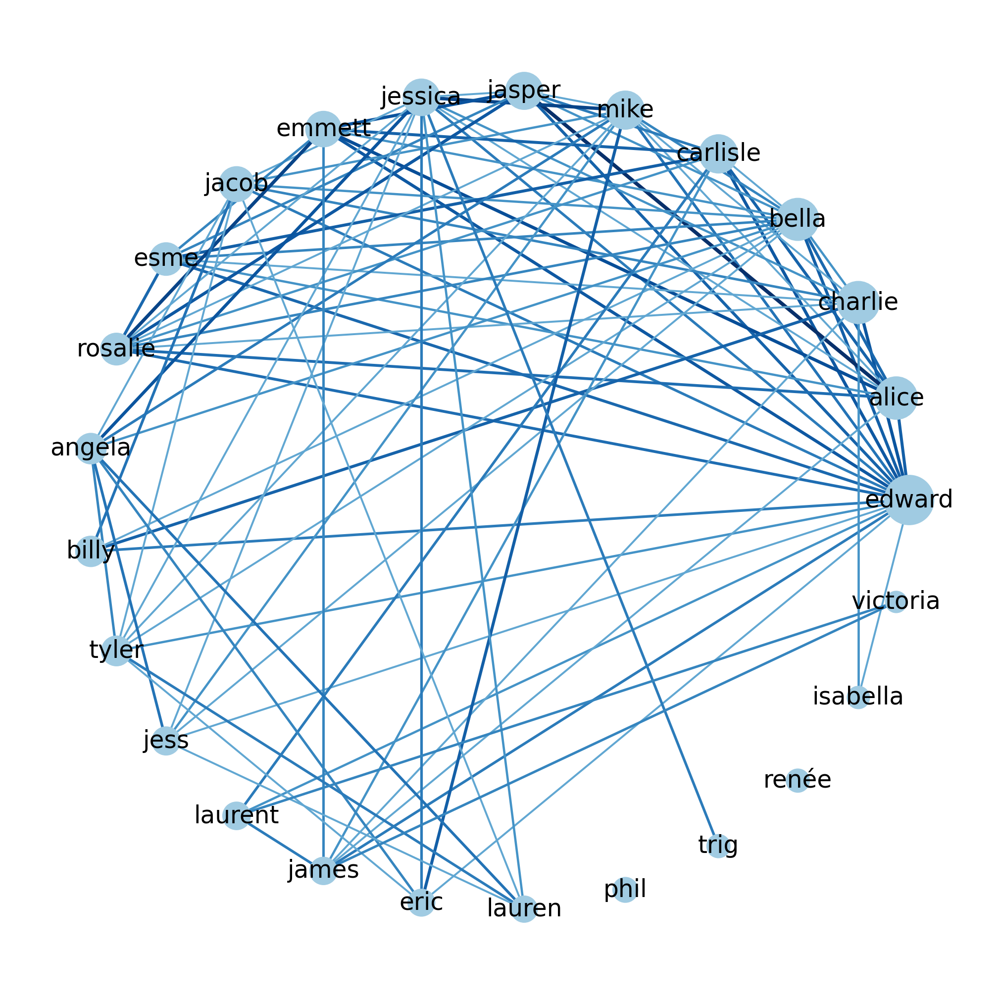

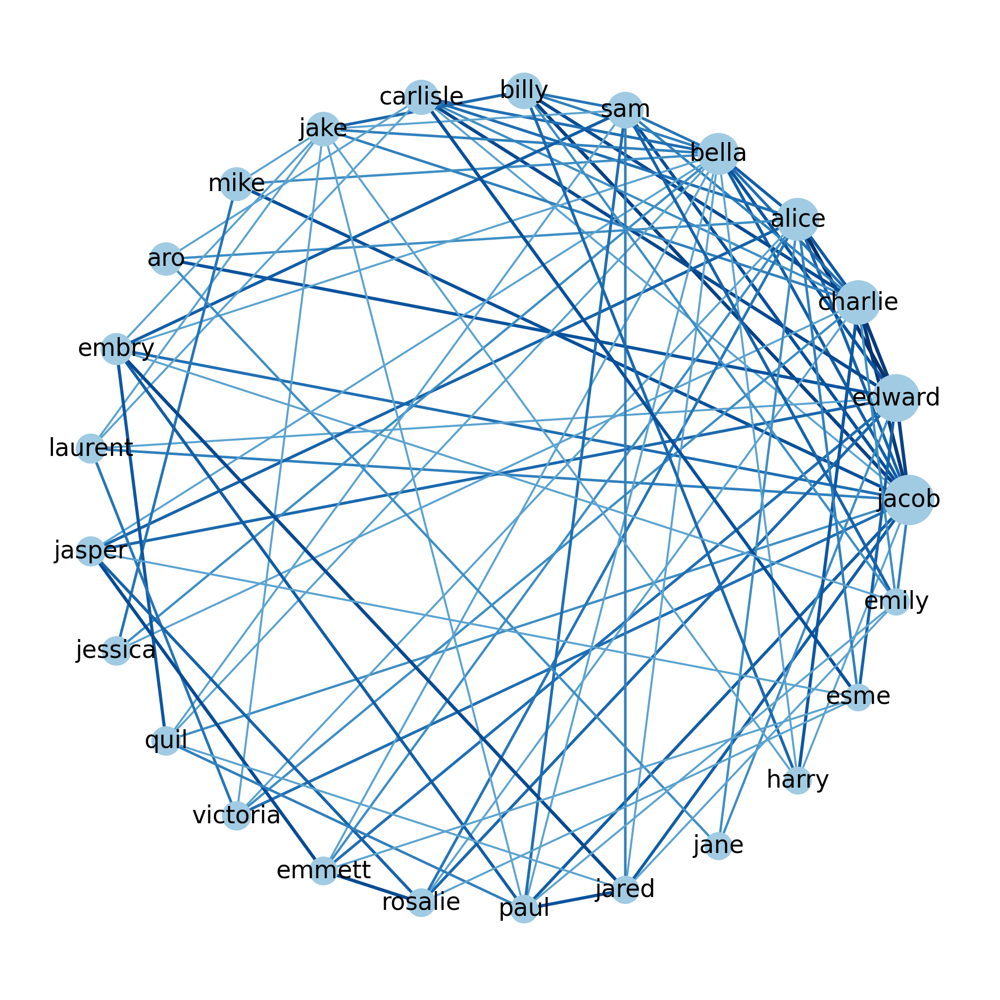

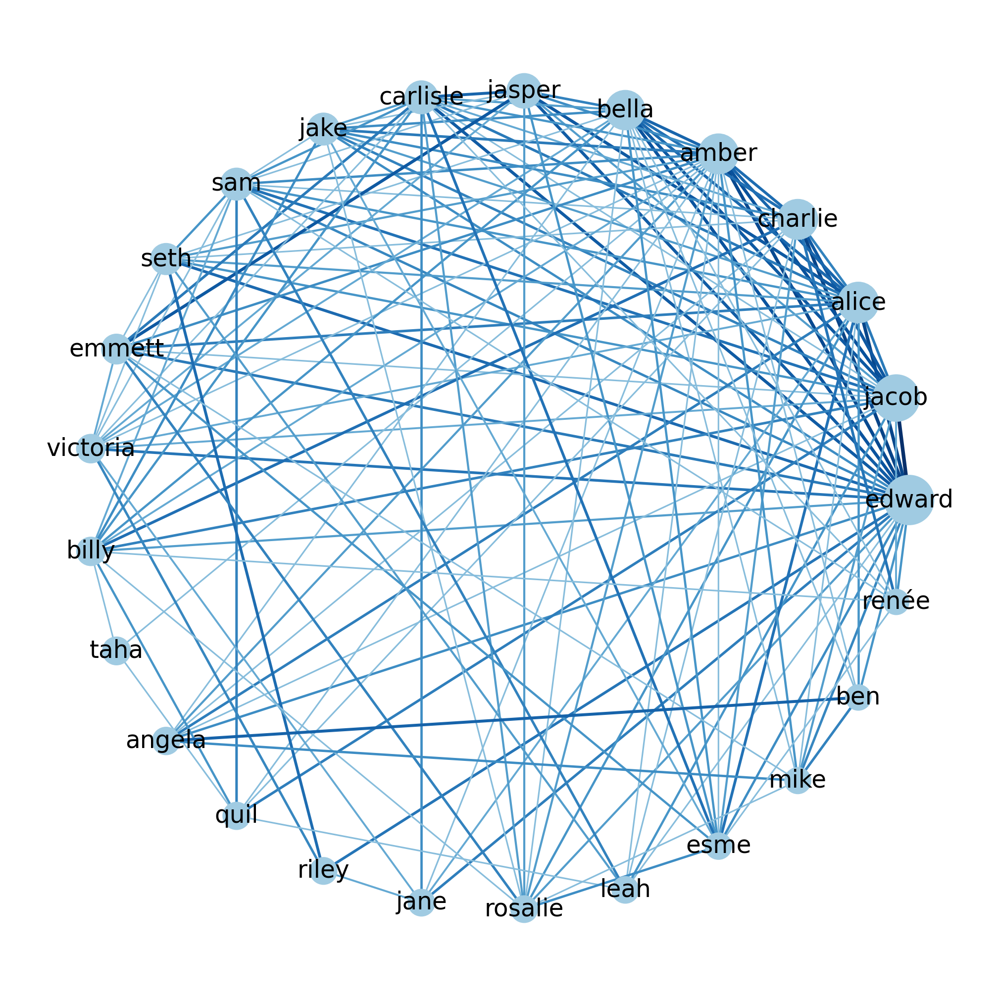

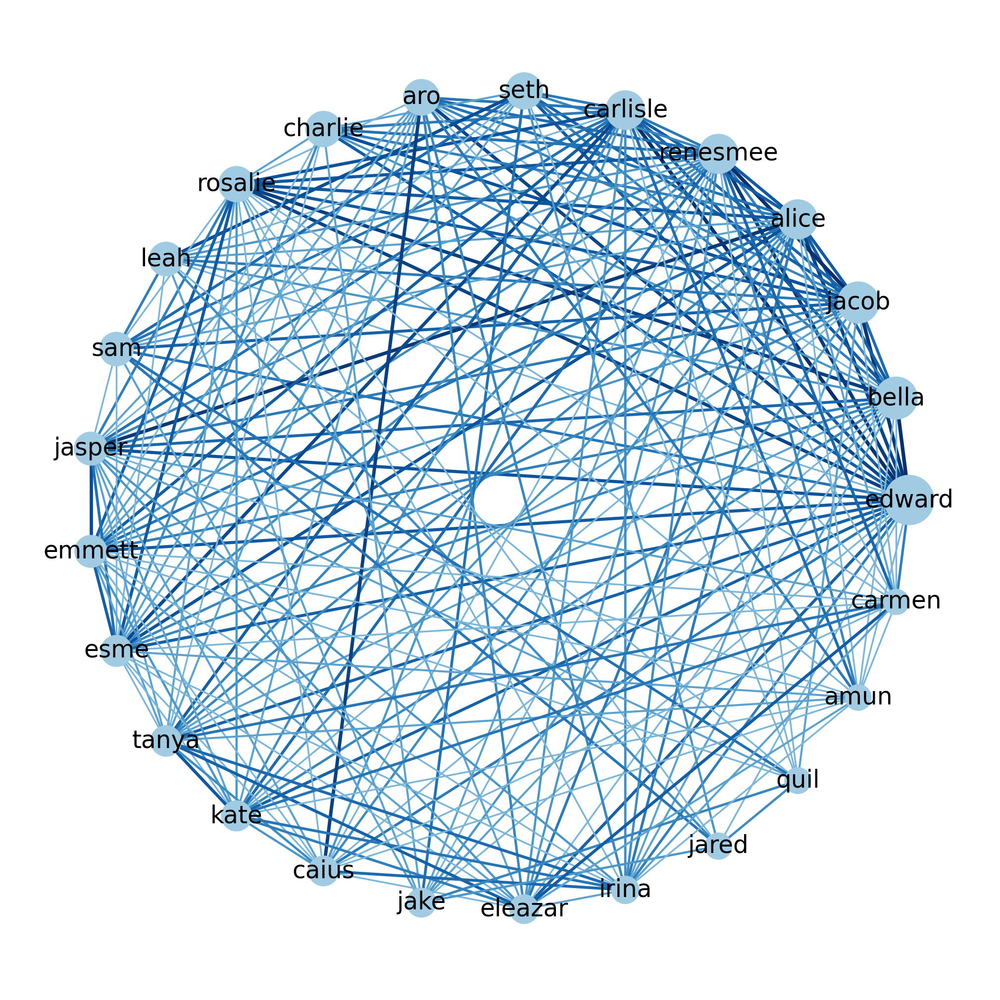

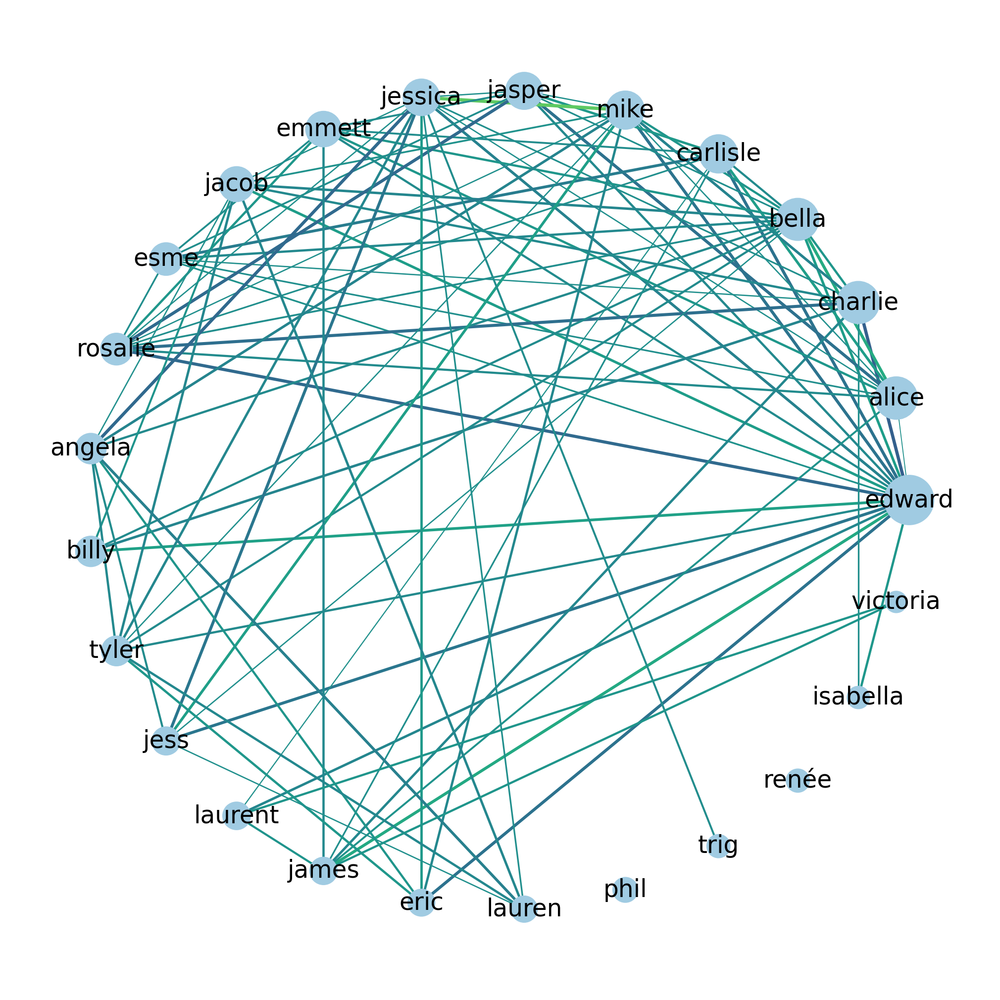

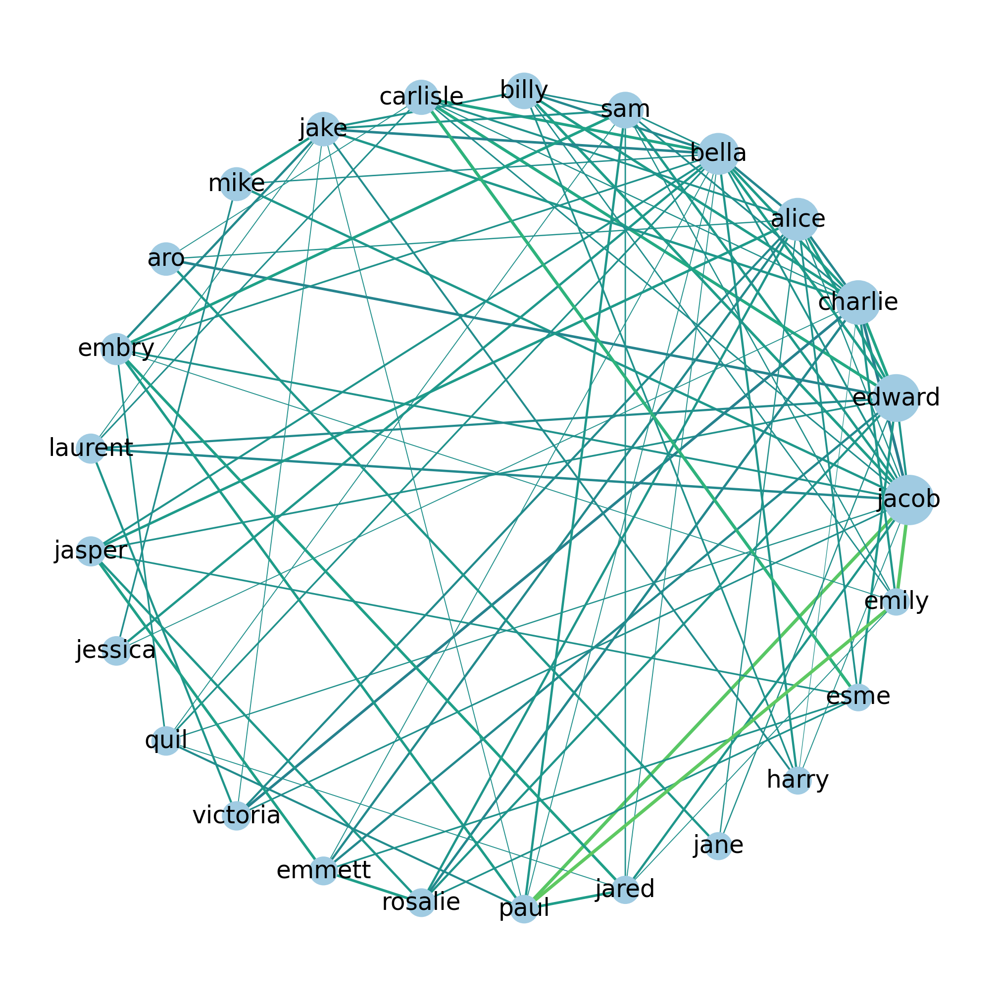

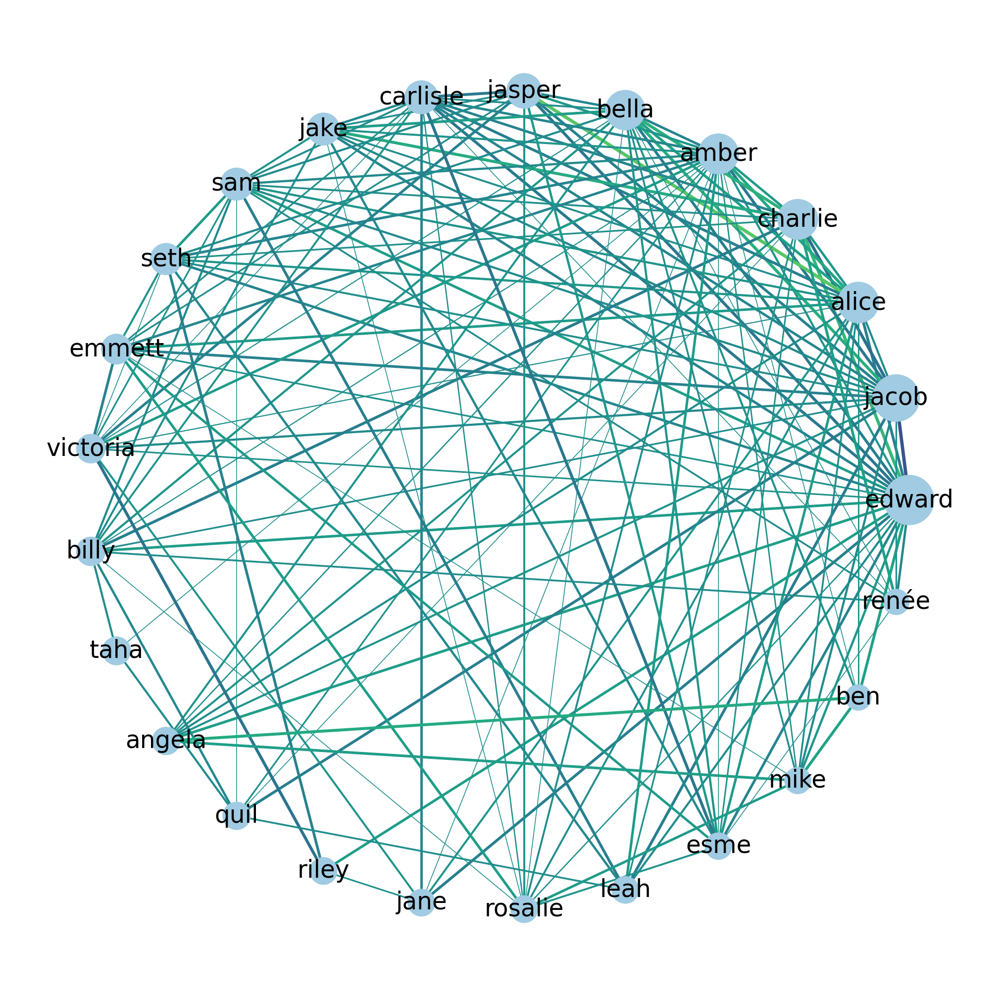

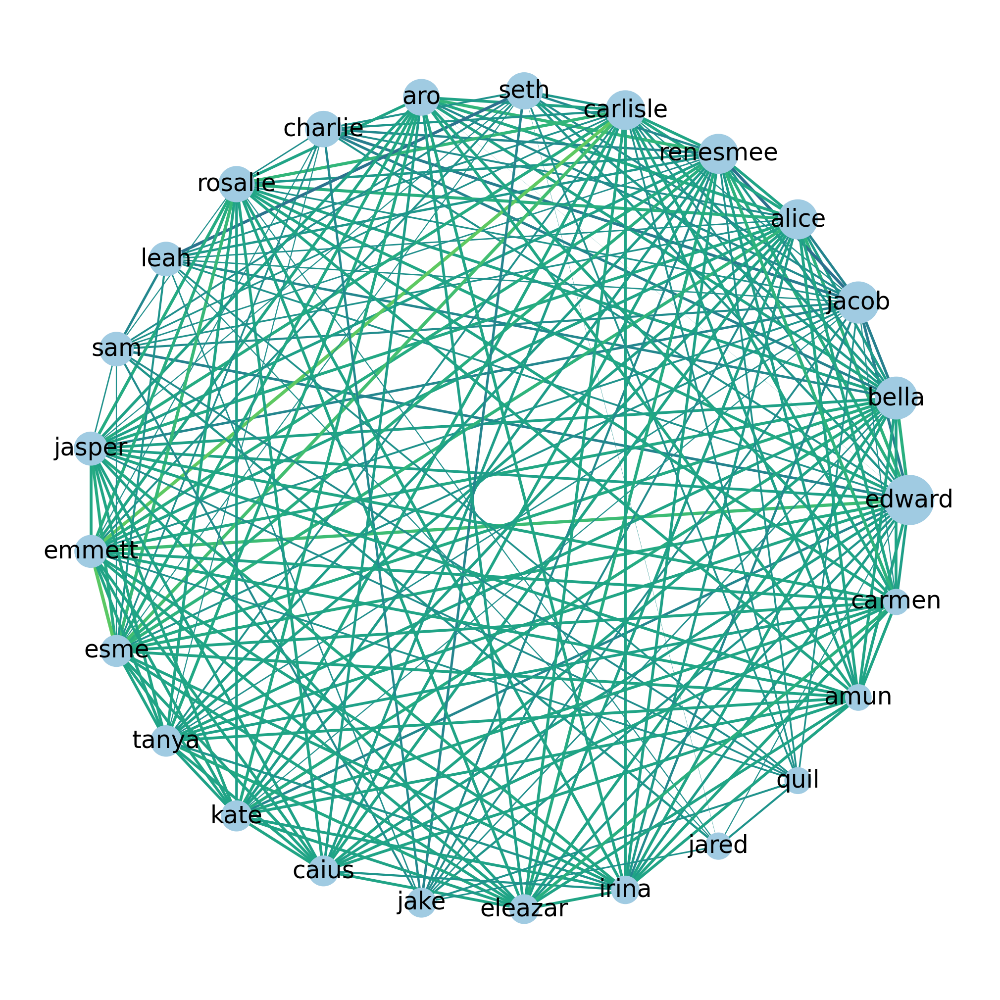

In [ ]:
def plot_graph(name_list, name_frequency, matrix, plt_name, mode, path=''):
    '''
    Function to plot the network graph (co-occurrence network or sentiment network).
    :param name_list: the list of top character names in the novel.
    :param name_frequency: the list containing the frequencies of the top names.
    :param matrix: co-occurrence matrix or sentiment matrix.
    :param plt_name: the name of the plot (PNG file) to output.
    :param mode: 'co-occurrence' or 'sentiment'
    :param path: the path to output the PNG file.
    :return: a PNG file of the network graph.
    '''

    label = {i: i for i in name_list}
    edge_list = matrix_to_edge_list(matrix, mode, name_list)
    normalized_frequency = np.array(name_frequency) / np.max(name_frequency)

    plt.figure(figsize=(20, 20))
    G = nx.Graph()
    G.add_nodes_from(name_list)
    G.add_edges_from(edge_list)

    pos = nx.circular_layout(G)
    edges = G.edges()
    weights = [G[u][v]['weight'] for u, v in edges]
    colors = [G[u][v]['color'] for u, v in edges]

    if mode == 'co-occurrence':
        nx.draw(G, pos, node_color='#A0CBE2', node_size=np.sqrt(normalized_frequency) * 4000, edge_cmap=plt.cm.Blues,
                linewidths=10, font_size=35, labels=label, edge_color=colors, with_labels=True, width=weights)
    elif mode == 'sentiment':
        nx.draw(G, pos, node_color='#A0CBE2', node_size=np.sqrt(normalized_frequency) * 4000,
                linewidths=10, font_size=35, labels=label, edge_color=colors, with_labels=True,
                width=weights, edge_vmin=-1000, edge_vmax=1000)
    else:
        raise ValueError("mode should be either 'co-occurrence' or 'sentiment'")

    plt.savefig(path + plt_name + '.png')

plot_graph(name_list_1, name_frequency_1, cooccurrence_matrix_1, 'Twilight_1' + ' co-occurrence graph', 'co-occurrence')
plot_graph(name_list_2, name_frequency_2, cooccurrence_matrix_2, 'Twilight_2' + ' co-occurrence graph', 'co-occurrence')
plot_graph(name_list_3, name_frequency_3, cooccurrence_matrix_3, 'Twilight_3' + ' co-occurrence graph', 'co-occurrence')
plot_graph(name_list_4, name_frequency_4, cooccurrence_matrix_4, 'Twilight_4' + ' co-occurrence graph', 'co-occurrence')

plot_graph(name_list_1, name_frequency_1, sentiment_matrix_1, 'Twilight_1' + ' sentiment graph', 'sentiment')
plot_graph(name_list_2, name_frequency_2, sentiment_matrix_2, 'Twilight_2' + ' sentiment graph', 'sentiment')
plot_graph(name_list_3, name_frequency_3, sentiment_matrix_3, 'Twilight_3' + ' sentiment graph', 'sentiment')
plot_graph(name_list_4, name_frequency_4, sentiment_matrix_4, 'Twilight_4' + ' sentiment graph', 'sentiment')

나

In [ ]:
# 파일 경로
file_path = "book_1.txt"

# 파일에 텍스트 쓰기
with open(file_path, 'w') as file:
    file.write(text_1)


In [ ]:
# 파일 경로
file_path = "book_2.txt"

# 파일에 텍스트 쓰기
with open(file_path, 'w') as file:
    file.write(text_2)
    # 파일 경로
file_path = "book_3.txt"

# 파일에 텍스트 쓰기
with open(file_path, 'w') as file:
    file.write(text_3)
    # 파일 경로
file_path = "book_4.txt"

# 파일에 텍스트 쓰기
with open(file_path, 'w') as file:
    file.write(text_4)

In [ ]:
import csv
import nltk
import pandas as pd
import numpy as np
import spacy
from nltk.tokenize import word_tokenize
import string
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import csv
import nltk
import pandas as pd
import numpy as np
import spacy
from nltk.tokenize import word_tokenize
import string

def load_book(book_path, lower=False):
    '''
    Reads in a novel from a .txt file, and returns it in (optionally
    lowercased) string form

    Parameters
    ----------
    book_path : string (required)
        path to txt file containing full text of book to be analysed
    lower : bool (optional)
        If True, the returned string will be lowercased;
        If False, the returned string will retain its original case formatting.

    Returns
    -------
    book : string
        book in string form
    '''
    with open(book_path) as f:
        book = f.read()
    if lower:
        book = book.lower()
    return book


def load_characters(charaters_path):
    '''
    Reads in a .csv file of character names

    Parameters
    ----------
    charaters_path : string (required)
        path to csv file containing full list of characters to be examined.
        Each character should take up one line of the file. If the character is
        referred to by multiple names, nicknames or sub-names within their
        full name, these should be split by commas, eg:
        Harry, Potter
        Lord, Voldemort, You-Know-Who
        Giant Squid

    Returns
    -------
    characters : list
        list of tuples naming characters in text
    '''
    with open(charaters_path) as f:
        reader = csv.reader(f)
        characters = [tuple(name.lower()+' ' for name in row) for row in reader]
    return characters


def remove_punctuation(input_string):
    '''
    Removes all punctuation from an input string

    Parameters
    ----------
    input_string : string (required)
        input string

    Returns
    -------
    clean_string : string
        clean string
    '''
    return input_string.translate(str.maketrans('', '', string.punctuation+'’'))


def extract_character_names(book):
    '''
    Automatically extracts lists of plausible character names from a book

    Parameters
    ----------
    book : string (required)
        book in string form (with original upper/lowercasing intact)

    Returns
    -------
    characters : list
        list of plasible character names
    '''
    nlp = spacy.load("en_core_web_sm")
    stopwords = nltk.corpus.stopwords.words('english')

    words = [remove_punctuation(w) for w in book.split()]
    unique_words = list(set(words))

    characters = [word.text for word in nlp(' '.join(unique_words)) if word.pos_ == 'PROPN']
    characters = [c for c in characters if len(c) > 2]
    characters = [c for c in characters if c.istitle()]
    characters = [c for c in characters if not (c[-1] == 's' and c[:-1] in characters)]
    characters = list(set([c.title() for c in [c.lower() for c in characters]]) - set(stopwords))

    return [tuple([c + ' ']) for c in set(characters)]


def get_sentence_sequences(book):
    '''
    Splits a book into its constituent sentences

    Parameters
    ----------
    book : string (required)
        book in string form

    Returns
    -------
    sentences : list
        list of strings, where each string is a sentence in the novel as
        interpreted by NLTK's tokenize() function.
    '''
    detector = nltk.data.load('tokenizers/punkt/english.pickle')
    sentences = detector.tokenize(book)
    return sentences


def get_word_sequences(book, n=50):
    '''
    Takes a book and splits it into its constituent words, returning a list of
    substrings which comprise the book, whose lengths are determined by a set
    number of words (default = 50).

    Parameters
    ----------
    book : string (required)
        book in string form
    n : int (optional)
        number of words to be contained in each returned sequence (default = 50)

    Returns
    -------
    sequences : list
        list of strings, where each string is a list of n words as interpreted
        by NLTK's word_tokenize() function.
    '''
    book_words = word_tokenize(book)
    return [' '.join(book_words[i: i+n]) for i in range(0, len(book_words), n)]


def get_character_sequences(book, n=200):
    '''
    Takes a book and splits it into a list of substrings of length n
    (default = 200).

    Parameters
    ----------
    book : string (required)
        book in string form
    n : int (optional)
        number of characters to be contained in each returned sequence
        (default = 200)

    Returns
    -------
    sequences : list
        list of strings comprising the book, where each string is of length n.
    '''
    return [''.join(book[i: i+n]) for i in range(0, len(book), n)]


def find_connections(sequences, characters):
    '''
    Takes a novel and its character list and counts instances of each character
    in each sequence.

    Parameters
    ----------
    sequences : list (required)
        list of substrings representing the novel to be analysed
    characters : list (required)
        list of charater names (as tuples)

    Returns
    -------
    df : pandas.DataFrame
        columns = character names
        indexes = sequences
        values  = counts of instances of character name in sequence
    '''
    if any(len(names) > 1 for names in characters):
        df = pd.DataFrame({str(character):
                           {sequence: sum([sequence.count(name) for name in character])
                            for sequence in sequences}
                           for character in characters})
    else:
        characters = [c[0] for c in characters]
        df = pd.DataFrame([[sequence.count(character)
                            for character in characters]
                           for sequence in sequences],
                          index=sequences,
                          columns=characters)
    return df

def calculate_cooccurence(df):
    '''
    Uses the dot product to calculate the number of times two characters appear
    in the same sequences. This is the core of the bookworm graph.

    Parameters
    ----------
    df : pandas.DataFrame (required)
        columns = character names
        indexes = sequences
        values  = counts of instances of character name in sequence

    Returns
    -------
    cooccurence : pandas.DataFrame
        columns = character names
        indexes = character names
        values  = counts of character name cooccurences in all sequences
    '''
    characters = df.columns.values
    cooccurence = df.values.T.dot(df.values)
    np.fill_diagonal(cooccurence, 0)
    cooccurence = pd.DataFrame(cooccurence, columns=characters, index=characters)
    return cooccurence


def get_interaction_df(cooccurence, threshold=0):
    '''
    Produces an dataframe of interactions between characters using the
    cooccurence matrix of those characters. The return format is directly
    analysable by networkx in the construction of a graph of characters.

    Parameters
    ----------
    cooccurence : pandas.DataFrame (required)
        columns = character names
        indexes = character names
        values  = counts of character name cooccurences in all sequences
    threshold : int (optional)
        The minimum character interaction strength needed to be included in the
        returned interaction_df

    Returns
    -------
    interaction_df : pandas.DataFrame
        DataFrame enumerating the strength of interactions between charcters.
        source = character one
        target = character two
        value = strength of interaction between character one and character two
    '''
    rows, columns = np.where(np.triu(cooccurence.values, 1) > threshold)

    return pd.DataFrame(np.column_stack([cooccurence.index[rows],
                                         cooccurence.columns[columns],
                                         cooccurence.values[rows, columns]]),
                        columns=['source', 'target', 'value'])


def bookworm(book_path, charaters_path=None, threshold=2):
    '''
    Wraps the full bookworm analysis from the raw .txt file's path, to
    production of the complete interaction dataframe. The returned dataframe is
    directly analysable by networkx using:

    nx.from_pandas_dataframe(interaction_df,
                             source='source',
                             target='target')

    Parameters
    ----------
    book_path : string (required)
        path to txt file containing full text of book to be analysed
    charaters_path : string (optional)
        path to csv file containing full list of characters to be examined

    Returns
    -------
    interaction_df : pandas.DataFrame
        DataFrame enumerating the strength of interactions between charcters.
        source = character one
        target = character two
        value = strength of interaction between character one and character two
    '''
    book = load_book(book_path)
    sequences = get_sentence_sequences(book)

    if charaters_path is None:
        characters = extract_character_names(book)
    else:
        characters = load_characters(charaters_path)

    df = find_connections(sequences, characters)
    cooccurence = calculate_cooccurence(df)
    return get_interaction_df(cooccurence, threshold)

In [ ]:
book_1 = load_book('/content/book_1.txt', lower=False)
characters_1 = extract_character_names(book_1)
sequences_1 = get_sentence_sequences(book_1)

book_2 = load_book('/content/book_2.txt', lower=False)
characters_2 = extract_character_names(book_2)
sequences_2 = get_sentence_sequences(book_2)

book_3 = load_book('/content/book_3.txt', lower=False)
characters_3 = extract_character_names(book_3)
sequences_3 = get_sentence_sequences(book_3)

book_4 = load_book('/content/book_4.txt', lower=False)
characters_4 = extract_character_names(book_4)
sequences_4 = get_sentence_sequences(book_4)

In [ ]:
book = sequences_1 +sequences_2 + sequences_3 + sequences_4
characters = list(set(characters_1 + characters_2 + characters_3 + characters_4))

In [ ]:
df = find_connections(book, characters)

In [ ]:
cooccurence = calculate_cooccurence(df)
cooccurence = cooccurence.loc[(cooccurence != 0).any(axis=1), (cooccurence != 0).any()]


cooccurence

In [ ]:
interaction_df = get_interaction_df(cooccurence, threshold=1)
interaction_df

In [ ]:
interaction_df.to_csv('character_interaction.csv', index=False)
df_filtered = interaction_df[interaction_df['value'] > 4].head(20)

In [ ]:
df_sorted = df_filtered.sort_values(by='value', ascending=False)

print(df_sorted)

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph object
G = nx.Graph()

# Iterate through the DataFrame & add edges
for _, edge in df_filtered .iterrows():
    G.add_edge(edge['source'], edge['target'], weight=edge['value'])

G.edges

In [ ]:
edge_width = [G[u][v].get('weight', 1)/10 for u, v in G.edges()]
edge_color = 'gray'


pos = nx.spring_layout(G, seed=42)

nx.draw(G, pos, with_labels=True,  node_size=100, node_color = 'green' ,
        font_color='black', font_size =15,edge_color=edge_color, width=edge_width,alpha = 0.8)

# 추가적인 그래프 개선 옵션 (선택 사항)
plt.title("Characters correlation", fontsize=16, fontweight="bold")
plt.axis('off')  # 축 숨기기
plt.show()

In [ ]:
# 네트워크 G 안에서 특정 노드(name) 사이의 weight가 큰 neighbor 순서대로 10명 출력하는 함수
def find_ten_closest(G, name):
    neighbors_list = list(G.neighbors(f"{name}"))

    temp_dict = {}
    for n in neighbors_list:
        weight = G.edges[f"{name}", n]['weight']
        temp_dict[n] = weight

    sorted_list = sorted(temp_dict.items(), key=(lambda x:x[1]), reverse=True)
    for n, w in sorted_list[0:10]:  # 1~10위
        print(f'{n}:  {w}')


In [ ]:
G.nodes

In [ ]:
find_ten_closest(G, 'Alice ')

In [ ]:
!pip install community

In [ ]:
from community import community_louvain
import matplotlib.cm as cm


partitions = community_louvain.best_partition(G)
values = [partitions.get(node) for node in G.nodes()]

nx.draw(G,
        cmap=plt.get_cmap("RdYlBu"),node_size=50,font_size=5,
        node_color=values,
        with_labels=True)


중요도 분석 (흐름)

In [ ]:
def make_an_cooccurence_csv(book,characters,file_name) :
  df = find_connections(book, characters)

  cooccurence = calculate_cooccurence(df)
  cooccurence = cooccurence.loc[(cooccurence != 0).any(axis=1), (cooccurence != 0).any()]

  interaction_df = get_interaction_df(cooccurence, threshold=1)

  interaction_df.to_csv(file_name, index=False)
  df_filtered = interaction_df[interaction_df['value'] > 5].head(15)
  return df_filtered

interaction_1 = make_an_cooccurence_csv(sequences_1,characters_1,'cooccurrence_book_1')
interaction_2 = make_an_cooccurence_csv(sequences_2,characters_2,'cooccurrence_book_2')
interaction_3 = make_an_cooccurence_csv(sequences_3,characters_3,'cooccurrence_book_3')
interaction_4 = make_an_cooccurence_csv(sequences_4,characters_4,'cooccurrence_book_4')

In [ ]:
top15_interaction_list = [interaction_1,interaction_2,interaction_3,interaction_4]
G_books = []
for book in top15_interaction_list:
    G_book = nx.Graph()
    for _, edge in book.iterrows():
        G_book.add_edge(edge['source'], edge['target'], weight=edge['value'])
    G_books.append(G_book)

In [ ]:
# Creating a list of degree centrality of all the books
evol = [nx.degree_centrality(G) for G in G_books]

# Creating a DataFrame from the list of degree centralities in all the books
index = ['Book1', 'Book2', 'Book3', 'Book4']
degree_evol_df = pd.DataFrame.from_records(evol, index=index).fillna(0) # 모든 책에 모든 캐릭터가 있는 게 아니므로, N/A는 0으로 채워줌

# 각 책의 중요도 top 5 인물 선택
set_of_char = set()
for i in index:   # 1~7권
    set_of_char |= set(list(degree_evol_df.T[i].sort_values(ascending=False)[0:5].index))
            # |=는 왼쪽과 오른쪽의 합집합을 왼쪽에 assign해주는 역할
list_of_char = list(set_of_char)

# Evolution of Top Characters 시각화
degree_evol_df[list_of_char].plot(figsize=(13, 7));